## The GTZAN music genre dataset. 
The goal is to classify different genres of music. The genre labels are:

0 'blues'

1 'classical'

2 'country'

3 'disco'

4 'hiphop'

5 'jazz'

6 'metal'

7 'pop'

8 'reggae'

9 'rock'

There are 8000 labeled training examples, 100 validation examples, and 100 test examples. Sampling rate is 22050 Hz

In [1]:
!rm gtzan.zip
!gdown --id 1wAjDwxWMSjrWz4-tbQyWIyqGLMVetWed
!unzip gtzan.zip

import numpy as np
K=10
X_tr = np.load('gtzan_tr.npy')
y_tr_dense = X_tr[:,-1]
y_tr = np.zeros((X_tr.shape[0],K))
y_tr[range(X_tr.shape[0]),y_tr_dense.astype(int)] = 1
X_tr = X_tr[:,:-1]
X_vl = np.load('gtzan_cv.npy')
y_vl_dense = X_vl[:,-1]
y_vl = np.zeros((X_vl.shape[0],K))
y_vl[range(X_vl.shape[0]),y_vl_dense.astype(int)] = 1
X_vl = X_vl[:,:-1]
X_ts = np.load('gtzan_te.npy')
y_ts_dense = X_ts[:,-1]
y_ts = np.zeros((X_ts.shape[0],K))
y_ts[range(X_ts.shape[0]),y_ts_dense.astype(int)] = 1
X_ts = X_ts[:,:-1]

print('The shape of X_ts is: ', X_ts.shape)
print('The shape of y_ts is: ', y_ts.shape)
print('The shape of X_vl is: ', X_vl.shape)
print('The shape of y_vl is: ', y_vl.shape)
print('The shape of X_tr is: ', X_tr.shape)
print('The shape of y_tr is: ', y_tr.shape)

rm: cannot remove 'gtzan.zip': No such file or directory
Downloading...
From: https://drive.google.com/uc?id=1wAjDwxWMSjrWz4-tbQyWIyqGLMVetWed
To: /content/gtzan.zip
934MB [00:18, 51.7MB/s]
Archive:  gtzan.zip
  inflating: gtzan_tr.npy            
  inflating: gtzan_cv.npy            
  inflating: gtzan_te.npy            
El tamaño de X_ts (datos de prueba) es:  (100, 44100)
El tamaño de y_ts (datos de prueba) es:  (100, 10)
El tamaño de X_vl (datos de validación) es:  (100, 44100)
El tamaño de y_vl (datos de validación) es:  (100, 10)
El tamaño de X_tr (datos de entrenamiento) es:  (8000, 44100)
El tamaño de y_tr (datos de entrenamiento) es:  (8000, 10)


## The IOWA Musical Instruments dataset (small sub version)

Recordings with a single note played in either Vilon, Viola, or Cello. 

The first 285 rows correspond to notes played with arco and the next 285 rows correspond to notes played with pizzicato. 

Sampling rate is 16000 Hz


In [2]:
!rm -r data_zip
!rm -r data
!mkdir data_zip
!mkdir data
import urllib.request
url = 'http://theremin.music.uiowa.edu/sound%20files/MIS%20Pitches%20-%202014/Strings/'
instruments = ['Violin','Viola','Cello']
attacks = ['arco','pizz']
strings = {'Violin':['E','A','D','G'], 'Viola':['A','D','G','C'], 'Cello':['A','D','G','C']}

for instrument in instruments:
  print('Downloading ', instrument, ' files')
  for attack in attacks:
    for string in strings[instrument]:
      filename = instrument+'.'+attack+'.ff.sul'+string+'.stereo.zip'
      fullpath = url+instrument+'/'+filename
      response = urllib.request.urlretrieve(fullpath,'data_zip/'+filename)

!for file in data_zip/*.zip; do unzip "$file" -d data; done
!for file in data/*.aif; do ffmpeg -i "$file" "$file".wav; done
!rm data/*.aif 
!rm -r data/__MACOSX

import glob
import librosa    
x_arco = []
for filename in glob.glob('data/*arco*.wav'):
  data, fs = librosa.load(filename, sr=16000)  
  x_arco.append(data)

x_pizz = []
for filename in glob.glob('data/*pizz*.wav'):
  data, fs = librosa.load(filename, sr=16000)
  x_pizz.append(data)

import numpy as np
x = x_arco + x_pizz
max_len = 16000
for idata, data in enumerate(x):
  x[idata] = np.ndarray.tolist(data[:max_len]) + [0]*(max_len - len(data))

X = np.array(x)
y = np.array([0]*len(x_arco) + [1]*len(x_pizz))

print('The shape of X is: ', X.shape)
print('The shape of y is: ', y.shape)

Streaming output truncated to the last 5000 lines.
Guessed Channel Layout for Input Stream #0.0 : stereo
Input #0, aiff, from 'data/Violin.arco.ff.sulA.Eb5.stereo.aif':
  Metadata:
    comment         : 
  Duration: 00:00:02.51, start: 0.000000, bitrate: 2118 kb/s
    Stream #0:0: Audio: pcm_s24be, 44100 Hz, stereo, s32 (24 bit), 2116 kb/s
Stream mapping:
  Stream #0:0 -> #0:0 (pcm_s24be (native) -> pcm_s16le (native))
Press [q] to stop, [?] for help
Output #0, wav, to 'data/Violin.arco.ff.sulA.Eb5.stereo.aif.wav':
  Metadata:
    ICMT            : 
    ISFT            : Lavf57.83.100
    Stream #0:0: Audio: pcm_s16le ([1][0][0][0] / 0x0001), 44100 Hz, stereo, s16, 1411 kb/s
    Metadata:
      encoder         : Lavc57.107.100 pcm_s16le
size=     433kB time=00:00:02.51 bitrate=1411.4kbits/s speed= 917x    
video:0kB audio:433kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.017592%
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  bui

# Zenodo databases

You can find many more datasets in Zenodo. Here you can see how to get a subset of the 3D-MARCo dataset, which contains recordings of music performances using multiple microphone arrays.

In [7]:
!wget -O acappella.zip https://zenodo.org/record/3477602/files/09%203D-MARCo%20Samples_Acappella.zip?download=1 
!unzip acapella.zip

import librosa

# loading one example file
y, fs = librosa.load('Acappella/Acappella_Eigenmike_Raw_32ch.wav', mono=False, sr=None)

--2021-08-01 22:00:04--  https://zenodo.org/record/3477602/files/09%203D-MARCo%20Samples_Acappella.zip?download=1
Resolving zenodo.org (zenodo.org)... 137.138.76.77
Connecting to zenodo.org (zenodo.org)|137.138.76.77|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1709452351 (1.6G) [application/octet-stream]
Saving to: ‘MARCo’

MARCo               100%[===================>]   1.59G  14.1MB/s    in 4m 42s  

2021-08-01 22:04:48 (5.78 MB/s) - ‘MARCo’ saved [1709452351/1709452351]



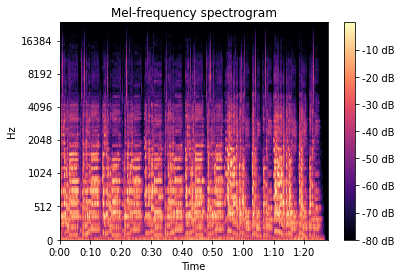

In [22]:
import matplotlib.pyplot as plt
import numpy as np
import librosa.display
import wave

ichan = 0
S = librosa.feature.melspectrogram(y[ichan], sr=fs)

fig, ax = plt.subplots()
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=fs,
                         ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')

from IPython.display import Audio
Audio(y[ichan],rate=fs)